<a id='0'></a>
# Learning Objective

1. Latar belakang
2. [How Delta Lake Can Help In Solving These Challenges?](#1)
3. [Delta Lake Architecture](#2)
4. [Create Delta Lake tables](#3)
5. [Create and query catalog tables](#4)
6. [Use Delta Lake for streaming data](#5)
7. [Streaming with Delta Lake tables](#6)
8. [Use Delta Lake with Spark in Azure Synapse Analytics](#7)
   + [8.1 Provision an Azure Synapse Analytics workspace](#7.1)
   + [8.2 Create delta tables](#7.2)
   + [8.3 Create catalog tables](#7.3)
   + [8.4 Use delta tables for streaming data](#7.4)
   + [8.5 Query a delta table from a serverless SQL pool](#7.5)
   + [8.6 Delete Azure resources](#7.6)




## Latar belakang

Seiring berjalannya waktu, kita telah menyaksikan evolusi sistem berbasis data seperti data werhausing, big data workloads (batch & stream), arsitektur lambda, dan data science workloads, tetapi sistem ini dikerjakan oleh tim data yang terisolasi sehingga menyebabkan duplikasi data dan berkurangnya produktivitas.

Sistem ini memiliki masalah seperti penimpaan data pada jalur yang sama yang menyebabkan hilangnya data jika terjadi kegagalan pekerjaan dan pembaruan pada data historis.

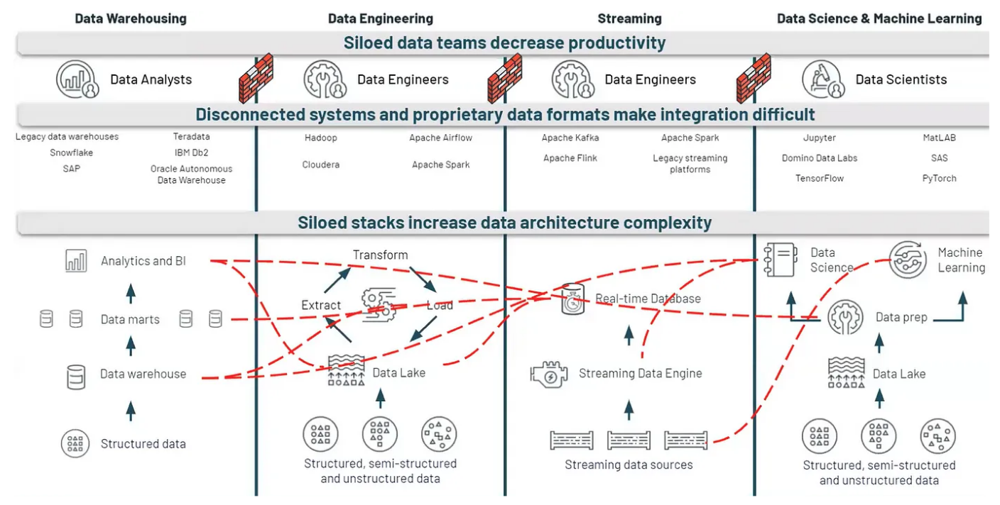

<a id='1'></a>
## How Delta Lake Can Help In Solving These Challenges?
Delta lake architecture provides solutions for the above-mentioned problem statement. This does not mean, we no longer need data warehousing and data lake solutions, these are not going anywhere.
Let's get into details…

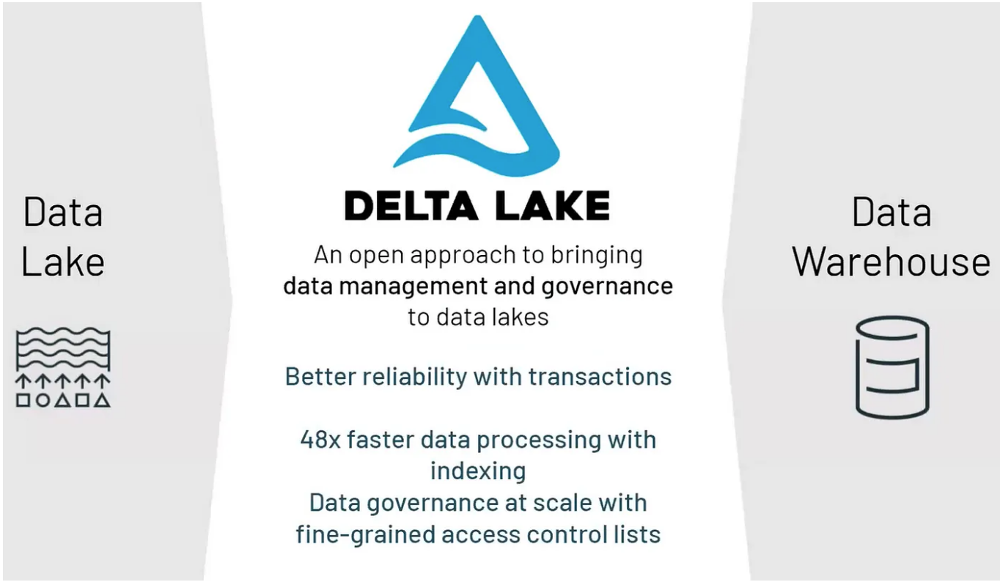

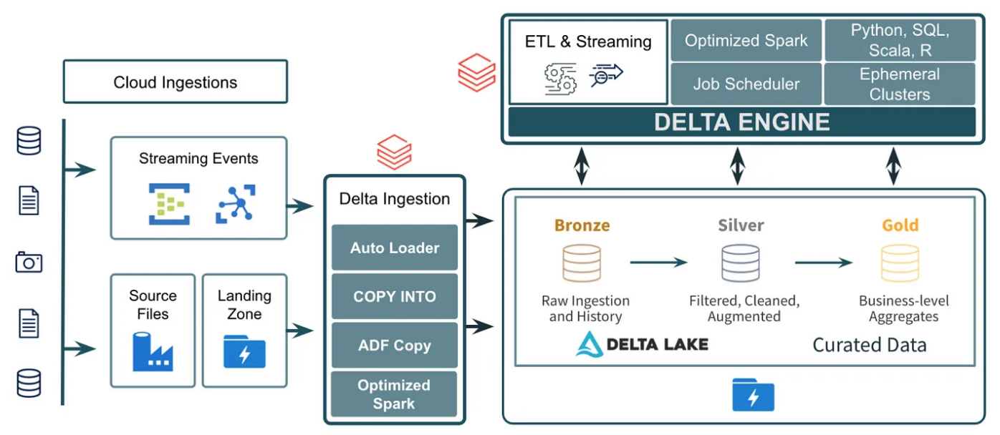

Linux foundation Delta Lake is an open-source storage layer for Spark that enables relational database capabilities for batch and streaming data. By using Delta Lake, you can implement a data lakehouse architecture in Spark to support SQL_based data manipulation semantics with support for transactions and schema enforcement. The result is an analytical data store that offers many of the advantages of a relational database system with the flexibility of data file storage in a data lake.

<a id='2'></a>
## Delta Lake Architecture
The Delta Lake Architecture is a massive improvement upon the conventional Lambda architecture.
At each stage, it improves our data through a connected pipeline and allows us to combine streaming and batch workflows through a shared file store with ACID-compliant transactions. Delta Lake is supported in Azure Synapse Analytics Spark pools for PySpark, Scala, and .NET code.

It organizes our data into layers or folders defined as bronze, silver, and gold as follows…

+ **Bronze tables** have raw data ingested from various sources (RDBMS data, JSON files, IoT data, etc.)
+ **Silver tables** will give a more refined view of our data using joins.
+ **Gold tables** give business-level aggregates often used for dashboarding and reporting.

And these Gold Tables can be consumed by various `Business Intelligence tools for reporting and analytics purposes`.

[...Learning Objective...](#0)
<a id='3'></a>
## Create Delta Lake tables

Delta lake is built on tables, which provide a relational storage abstraction over files in a data lake.

### Creating a Delta Lake table from a dataframe

+ One of the easiest ways to create a Delta Lake table is to save a dataframe in the delta format, specifying a path where the data files and related metadata information for the table should be stored.

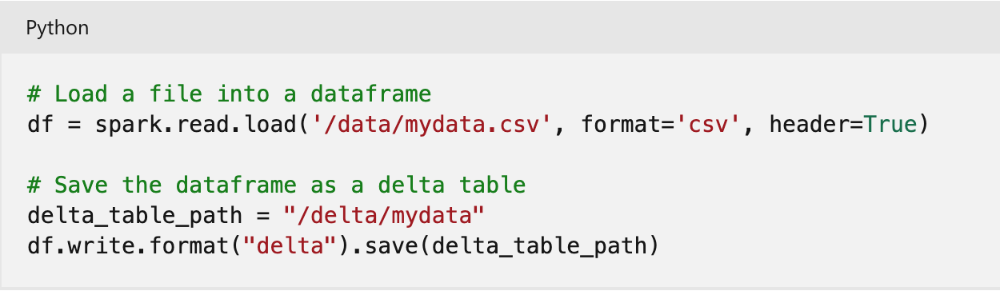

+ You can replace an existing Delta Lake table with the contents of a dataframe by using the overwrite mode, as shown here:
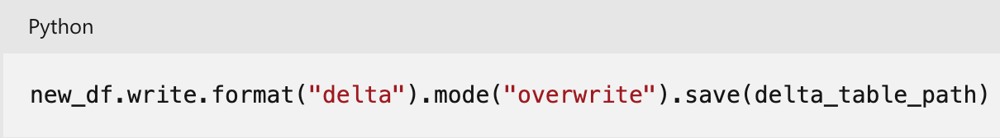

+ You can also add rows from a dataframe to an existing table by using the **append** mode:
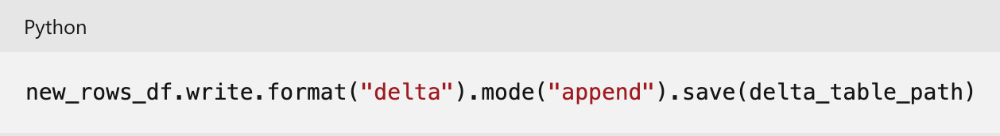

### Making conditional updates
To make such modifications to a Delta Lake table, you can use the DeltaTable object in the Delta Lake API, which supports update, delete, and merge operations. For example, you could use the following code to update the price column for all rows with a category column value of "Accessories":

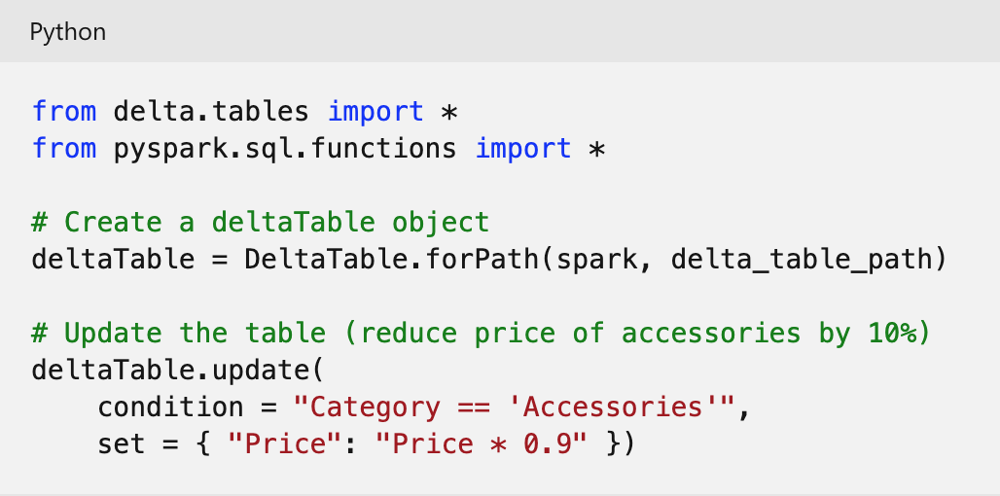


### Querying a previous version of a table
Delta Lake tables support versioning through the transaction log. The transaction log records modifications made to the table, noting the timestamp and version number for each transaction. You can use this logged version data to view previous versions of the table - a feature known as time travel.

+ You can retrieve data from a specific version of a Delta Lake table by reading the data from the delta table location into a dataframe, specifying the version required as a `versionAsOf` option:
  
  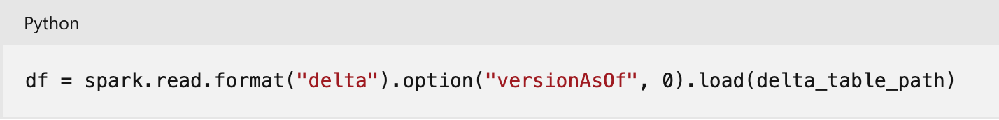

+ or you can specify a timestamp by using the `timestampAsOf` option:
  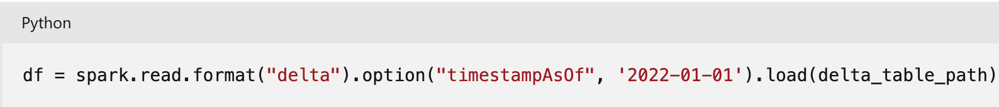

[...Learning Objective...](#0)
<a id='4'></a>
## Create and query catalog tables

So far we've considered Delta Lake table instances created from dataframes and modified through the Delta Lake API. You can also define Delta Lake tables as catalog tables in the metastore and work with them using SQL.

### Creating catalog tables
There are several ways to create catalog tables:
1. Creating a catalog table from a dataframe
2. Creating a catalog table using SQL
3. Using the DeltaTableBuilder API
   

[...Learning Objective...](#0)
<a id='5'></a>
## Use Delta Lake for streaming data

All of the data we've explored up to this point has been static data in files. However, many data analytics scenarios involve streaming data that must be processed in near real time. For example, you might need to capture readings emitted by internet-of-things (IoT) devices and store them in a table as they occur.

### Spark Structured Streaming

1. Spark includes native support for streaming data through Spark Structured Streaming, an API that is based on a boundless dataframe in which streaming data is captured for processing.

#### Basic Concepts
Consider the input data stream as the “Input Table”. Every data item that is arriving on the stream is like a new row being appended to the Input Table.
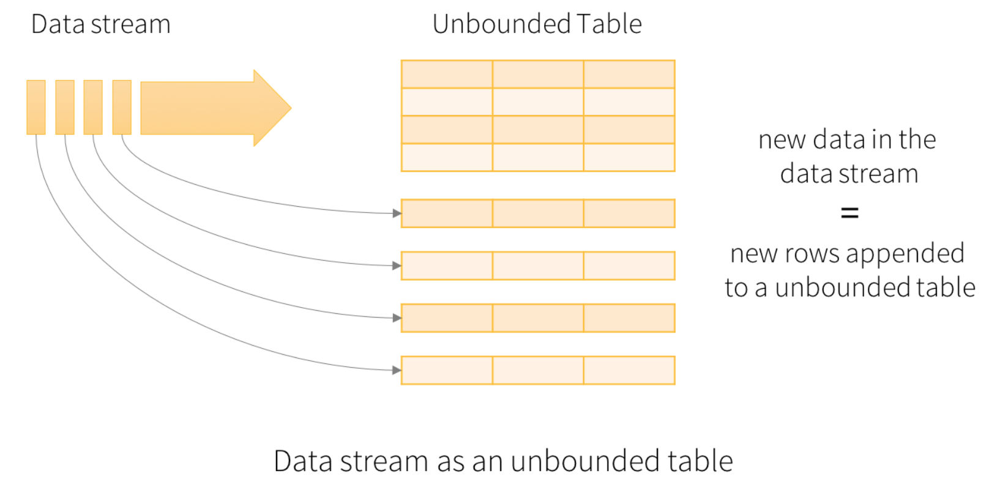

2. A Spark Structured Streaming dataframe can read data from many different kinds of streaming source, including **network ports**, **real time message brokering services** such as `Azure Event Hubs` or `Kafka`, or `file system locations`.

> Tip
>
> For more information about Spark Structured Streaming, see <a href="https://spark.apache.org/docs/latest/structured-streaming-programming-guide.html">Structured Streaming Programming Guide</a> in the Spark documentation.

[...Learning Objective...](#0)
<a id='6'></a>
## Streaming with Delta Lake tables

+ You can use a Delta Lake table as a source or a sink for Spark Structured Streaming.
+ For example, you could capture a stream of real time data from an IoT device and write the stream directly to a Delta Lake table as a sink - enabling you to query the table to see the latest streamed data.
+ Or, you could read a Delta Table as a streaming source, enabling you to constantly report new data as it is added to the table.

1. ### Using a Delta Lake table as a streaming source
   
In the following PySpark example, a Delta Lake table is used to store details of Internet sales orders. A stream is created that reads data from the Delta Lake table folder as new data is appended.

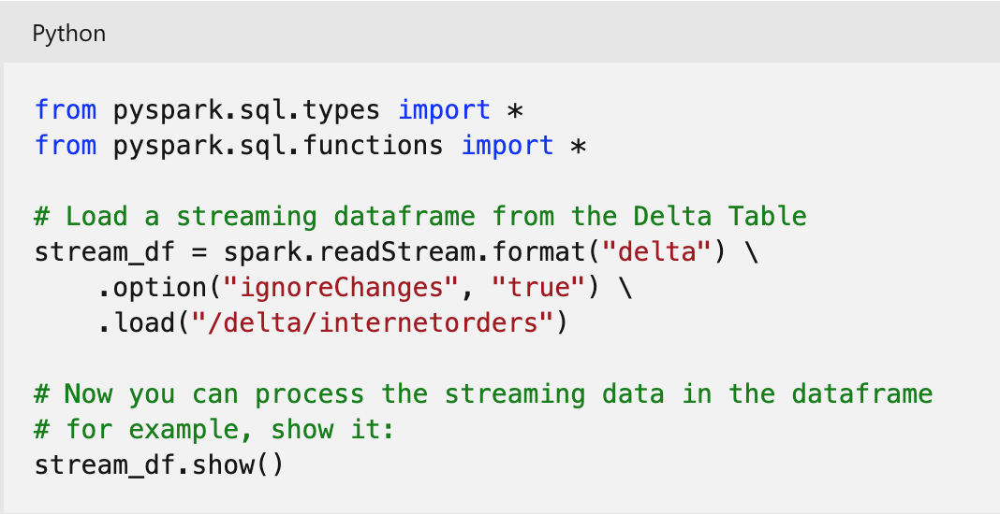

2. ### Using a Delta Lake table as a streaming sink

In the following PySpark example, a stream of data is read from JSON files in a folder. The JSON data in each file contains the status for an IoT device in the format {"device":"Dev1","status":"ok"} New data is added to the stream whenever a file is added to the folder. The input stream is a boundless dataframe, which is then written in delta format to a folder location for a Delta Lake table.

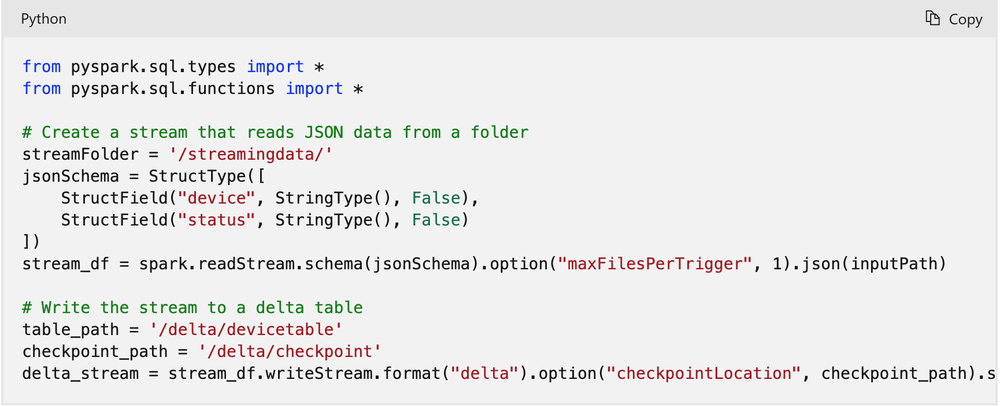

[...Learning Objective...](#0)
<a id='7'></a>
# Use Delta Lake with Spark in Azure Synapse Analytics


Delta Lake is an open source project to build a transactional data storage layer on top of a data lake. Delta Lake adds support for relational semantics for both batch and streaming data operations, and enables the creation of a Lakehouse architecture in which Apache Spark can be used to process and query data in tables that are based on underlying files in the data lake.

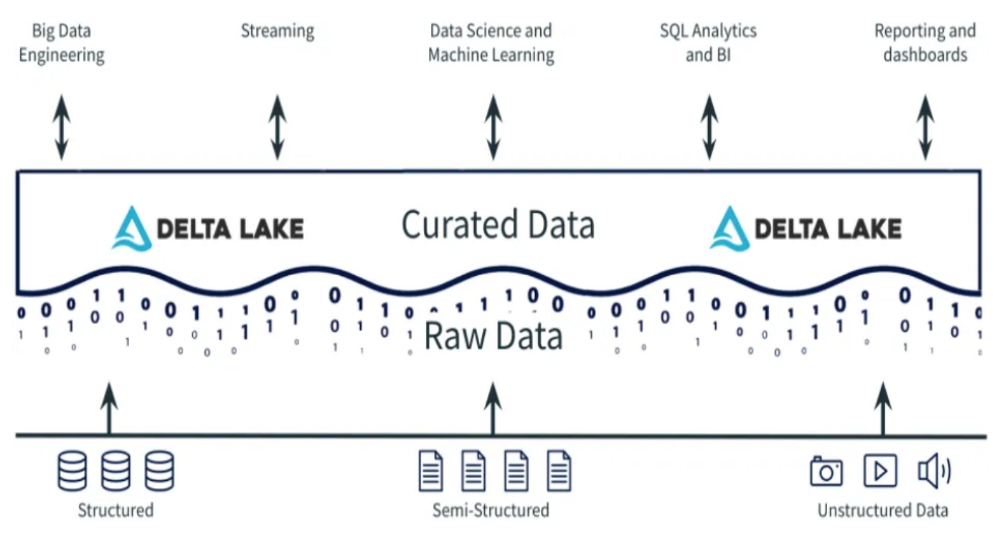

[...Learning Objective...](#0)
<a id='7.1'></a>
## 7.1 Provision an Azure Synapse Analytics workspace
You’ll need an Azure Synapse Analytics workspace with access to data lake storage and an Apache Spark pool that you can use to query and process files in the data lake.

In this exercise, you’ll use a combination of a PowerShell script and an ARM template to provision an Azure Synapse Analytics workspace.

1. Sign into the Azure portal at https://portal.azure.com.
2. Use the [>_] button to the right of the search bar at the top of the page to create a new Cloud Shell in the Azure portal, selecting a **PowerShell** environment and creating storage if prompted. The cloud shell provides a command line interface in a pane at the bottom of the Azure portal, as shown here:

> Note: If you have previously created a cloud shell that uses a Bash environment, use the the drop-down menu at the top left of the cloud shell pane to change it to **PowerShell**.

3. Note that you can resize the cloud shell by dragging the separator bar at the top of the pane, or by using the —, ◻, and X icons at the top right of the pane to minimize, maximize, and close the pane. For more information about using the Azure Cloud Shell, see the Azure Cloud Shell documentation.

4. In the PowerShell pane, enter the following commands to clone this repo:
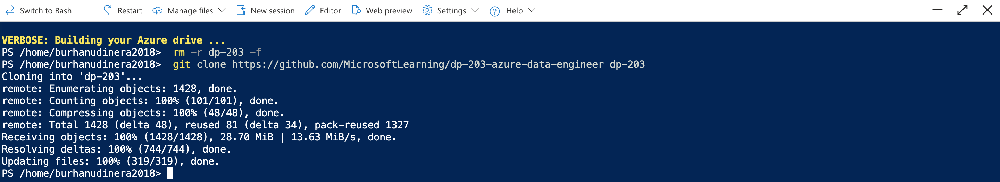
5. After the repo has been cloned, enter the following commands to change to the folder for this exercise and run the **setup.ps1** script it contains:

6. If prompted, choose which subscription you want to use (this will only happen if you have access to multiple Azure subscriptions).
7. When prompted, enter a suitable password to be set for your Azure Synapse SQL pool.

> Note: Be sure to remember this password! (**`S3cr3t@4zur3`**)
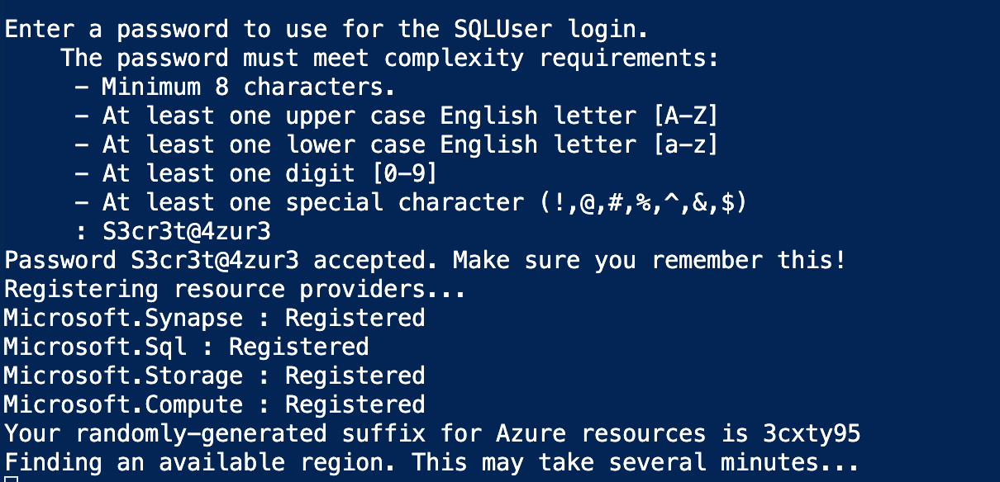

8. Wait for the script to complete - this typically takes around 10 minutes, but in some cases may take longer. While you are waiting, review the <a href="https://learn.microsoft.com/en-us/azure/synapse-analytics/spark/apache-spark-what-is-delta-lake">What is Delta Lake</a> article in the Azure Synapse Analytics documentation.
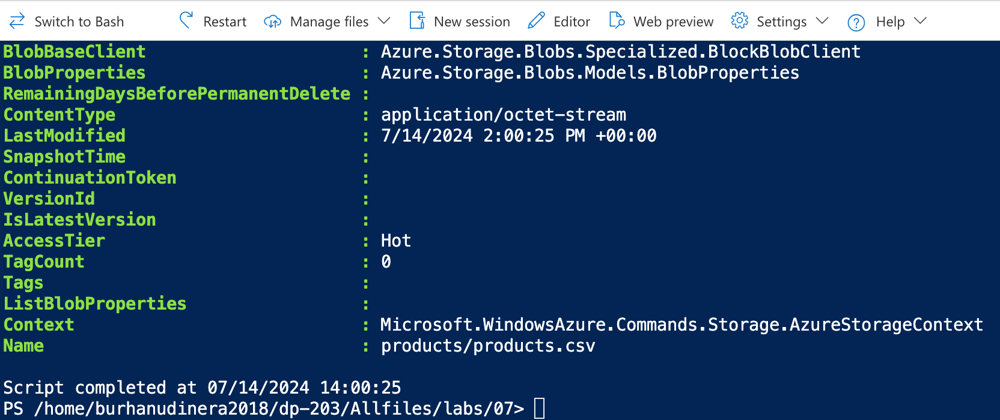
[...Learning Objective...](#0)
<a id='7.2'></a>
## 7.2 Create delta tables
The script provisions an Azure Synapse Analytics workspace and an Azure Storage account to host the data lake, then uploads a data file to the data lake.

### Explore the data in the data lake
1. After the script has completed, in the Azure portal, go to the **`dp203-3cxty95`** resource group that it created, and select your Synapse workspace.
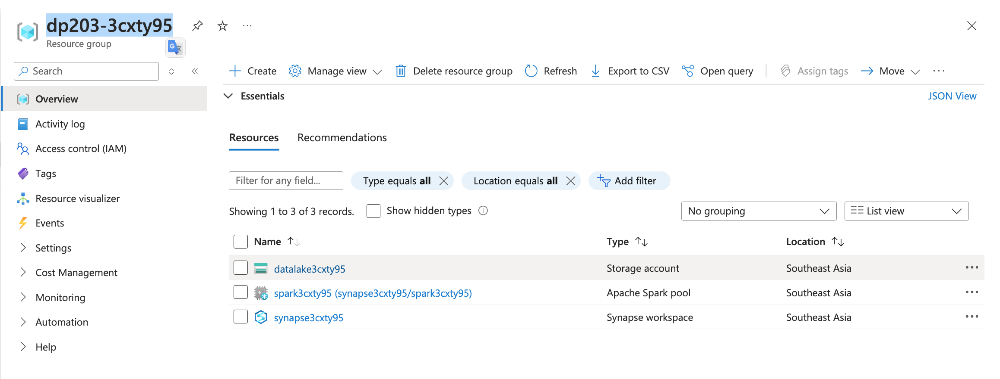
2. In the **Overview** page for your Synapse workspace, in the **Open Synapse Studio** card, select **Open** to open Synapse Studio in a new browser tab; signing in if prompted.
3. On the left side of Synapse Studio, use the ›› icon to expand the menu - this reveals the different pages within Synapse Studio that you’ll use to manage resources and perform data analytics tasks.
4. On the **Data** page, view the **Linked** tab and verify that your workspace includes a link to your Azure Data Lake Storage Gen2 storage account, which should have a name similar to **synapsexxxxxxx (Primary - datalakexxxxxxx)**.
5. Expand your storage account and verify that it contains a file system container named files.
6. Select the **files** container, and note that it contains a folder named **products**. This folder contains the data you are going to work with in this exercise.
7. Open the **products** folder, and observe that it contains a file named **products.csv**.
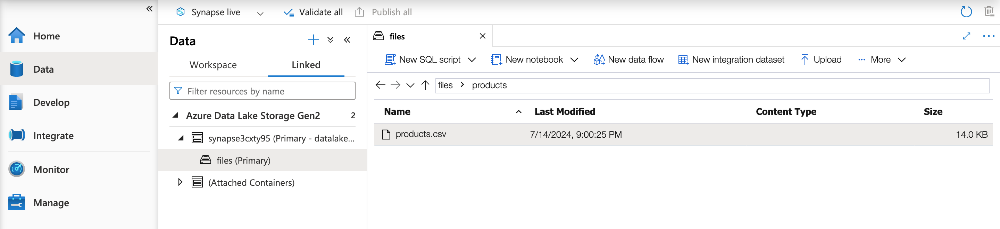
8. Select **products.csv**, and then in the **New notebook** list on the toolbar, select **Load to DataFrame**.
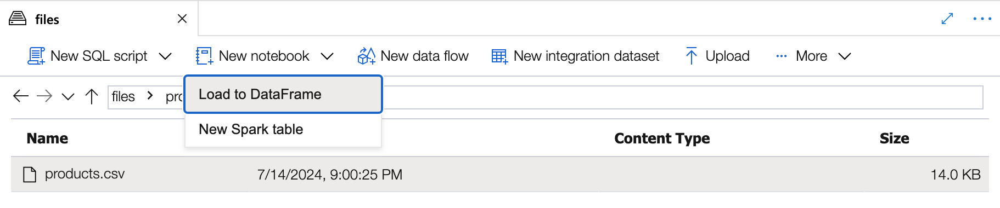
9. In the **Notebook 1** pane that opens, in the **Attach to** list, select the **sparkxxxxxxx** Spark pool and ensure that the **Language** is set to **PySpark (Python)**.
10. Review the code in the first (and only) cell in the notebook, which should look like this:
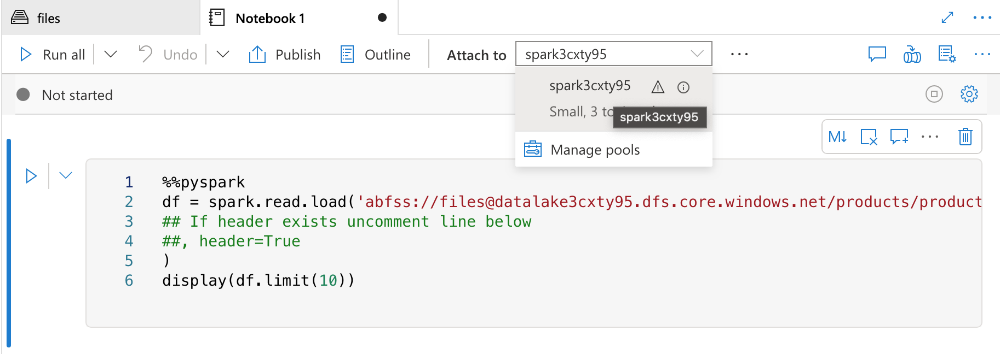
11. Uncomment the ,header=True line (because the products.csv file has the column headers in the first line), so your code looks like this:
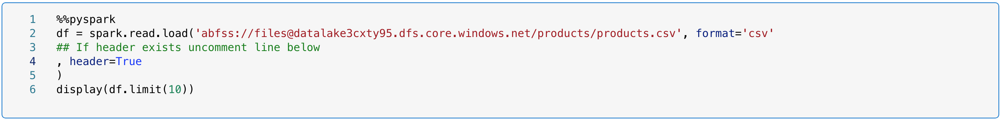
12. Use the ▷ icon to the left of the code cell to run it, and wait for the results. The first time you run a cell in a notebook, the Spark pool is started - so it may take a minute or so to return any results. Eventually, the results should appear below the cell, and they should be similar to this:
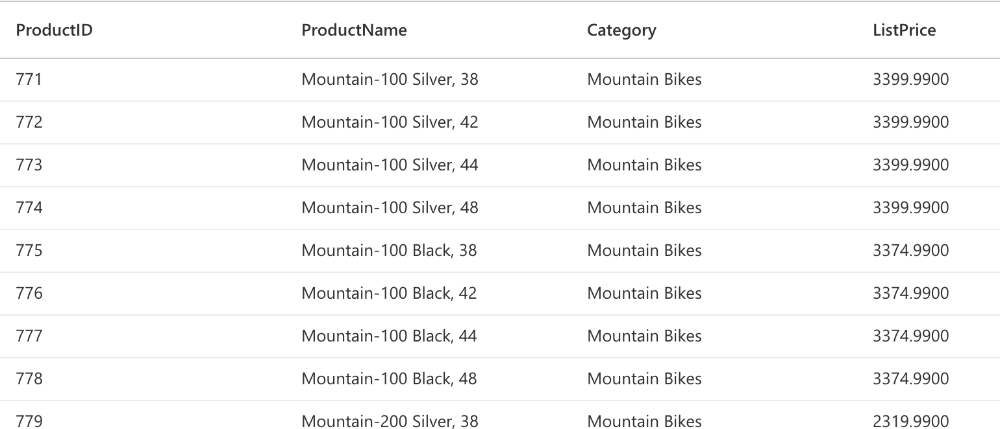
### Load the file data into a delta table
1. Under the results returned by the first code cell, use the **+ Code** button to add a new code cell. Then enter the following code in the new cell and run it:
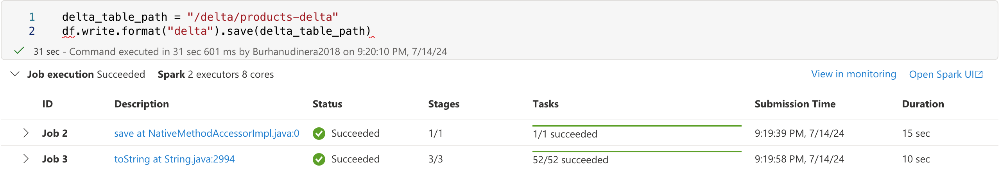
2. On the **files** tab, use the ↑ icon in the toolbar to return to the root of the **files** container, and note that a new folder named **delta** has been created. Open this folder and the **products-delta** table it contains, where you should see the parquet format file(s) containing the data.
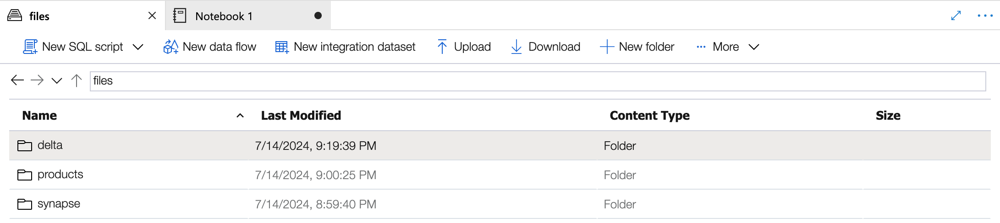
3. Return to the **Notebook 1** tab and add another new code cell. Then, in the new cell, add the following code and run it:
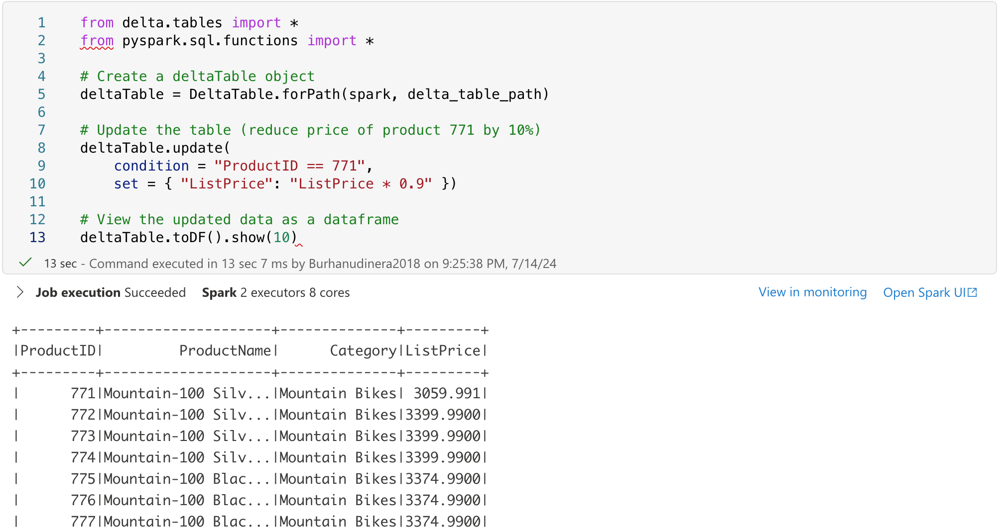
The data is loaded into a **DeltaTable** object and updated. You can see the update reflected in the query results.

4. Add another new code cell with the following code and run it:
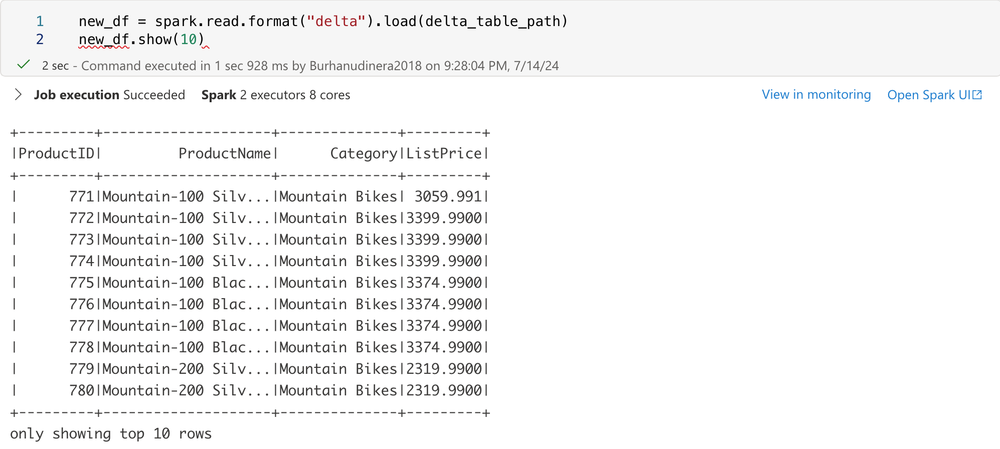
The code loads the delta table data into a data frame from its location in the data lake, verifying that the change you made via a **DeltaTable** object has been persisted.

5. Modify the code you just ran as follows, specifying the option to use the time travel feature of delta lake to view a previous version of the data.
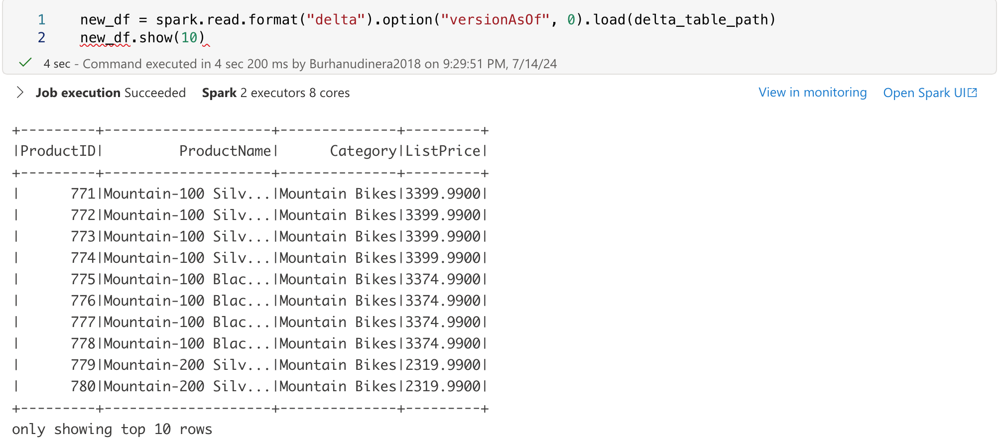
When you run the modified code, the results show the original version of the data.

6. Add another new code cell with the following code and run it:
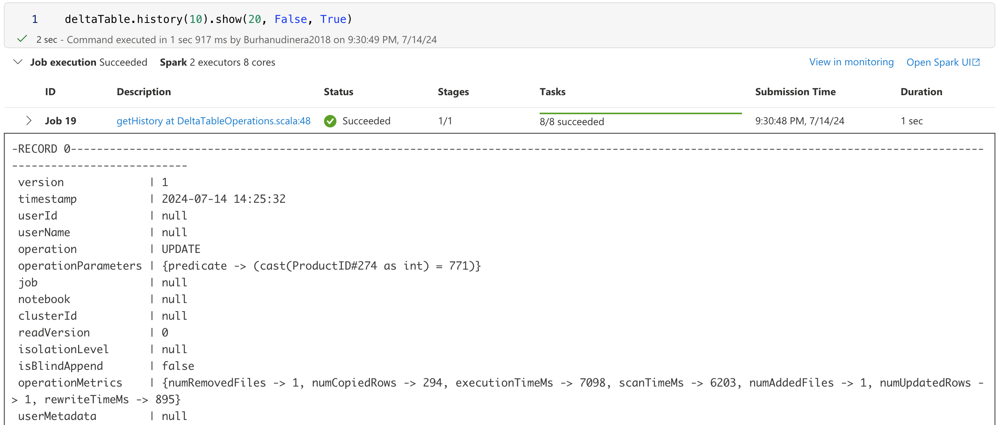
The history of the last 20 changes to the table is shown - there should be two (the original creation, and the update you made.)

[...Learning Objective...](#0)
<a id='7.3'></a>
## Create catalog tables
So far you’ve worked with delta tables by loading data from the folder containing the parquet files on which the table is based. You can define catalog tables that encapsulate the data and provide a named table entity that you can reference in SQL code. Spark supports two kinds of catalog tables for delta lake:

+ ***External tables*** that are defined by the path to the parquet files containing the table data.
+ ***Managed tables***, that are defined in the Hive metastore for the Spark pool.

### Create an external table
1. In a new code cell, add and run the following code:
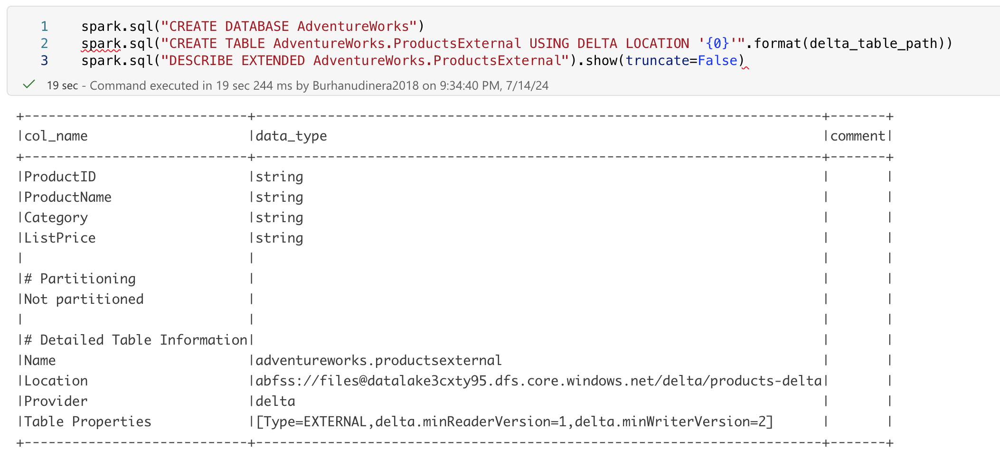
This code creates a new database named **AdventureWorks** and then creates an external tabled named **ProductsExternal** in that database based on the path to the parquet files you defined previously. It then displays a description of the table’s properties. Note that the **Location** property is the path you specified.

2. Add a new code cell, and then enter and run the following code:
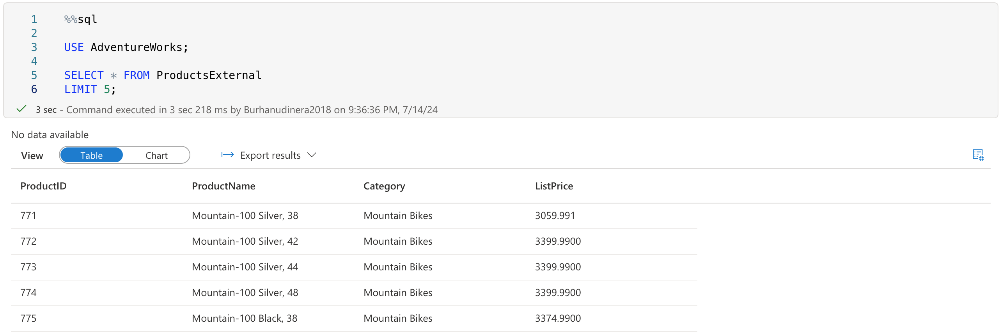
The code uses SQL to switch context to the **AdventureWorks** database (which returns no data) and then query the **ProductsExternal** table (which returns a resultset containing the products data in the Delta Lake table).

### Create a managed table
1. In a new code cell, add and run the following code:
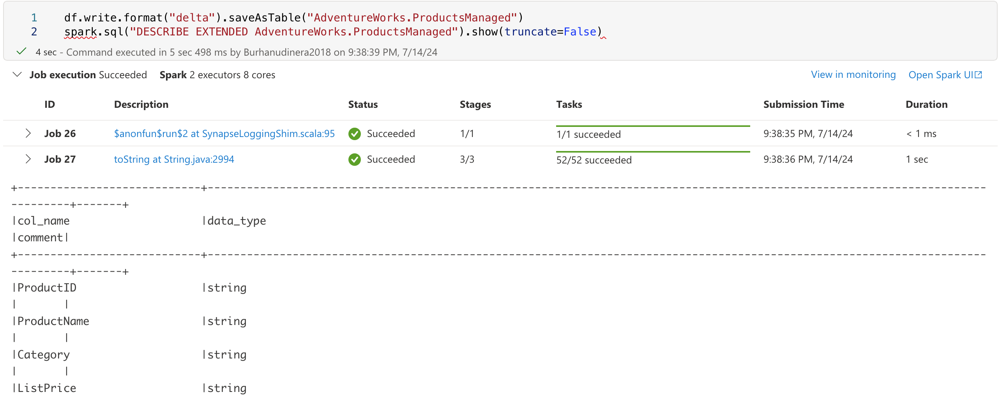
This code creates a managed tabled named **ProductsManaged** based on the DataFrame you originally loaded from the **products.csv** file (before you updated the price of product 771). You do not specify a path for the parquet files used by the table - this is managed for you in the Hive metastore, and shown in the **Location** property in the table description (in the **files/synapse/workspaces/synapsexxxxxxx/warehouse path)**.

2. Add a new code cell, and then enter and run the following code:
The code uses SQL to query the **ProductsManaged** table.

### Compare external and managed tables
1. In a new code cell, add and run the following code:
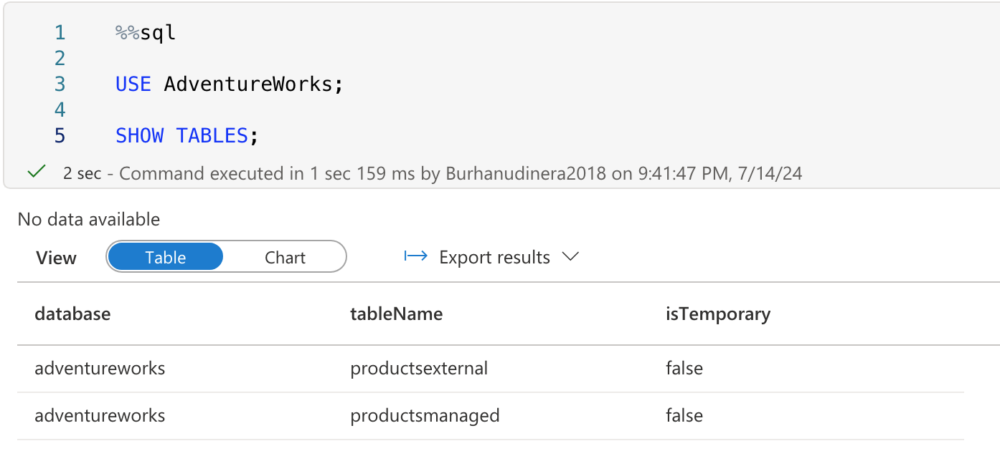
This code lists the tables in the **AdventureWorks** database.

2. Modify the code cell as follows, add run it:
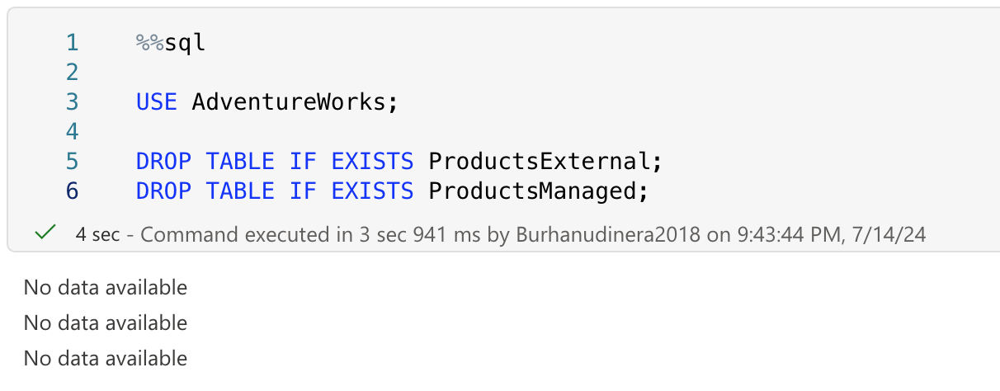
This code drops the tables from the metastore.

3. Return to the **files** tab and view the **files/delta/products-delta** folder. Note that the data files still exist in this location. Dropping the external table has removed the table from the metastore, but left the data files intact.
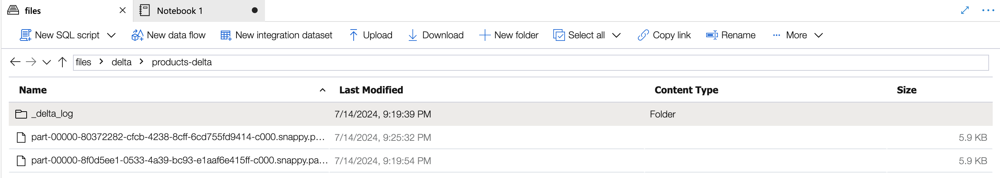
4. View the **files/synapse/workspaces/synapsexxxxxxx/warehouse** folder, and note that there is no folder for the **ProductsManaged** table data. Dropping a managed table removes the table from the metastore and also deletes the table’s data files.
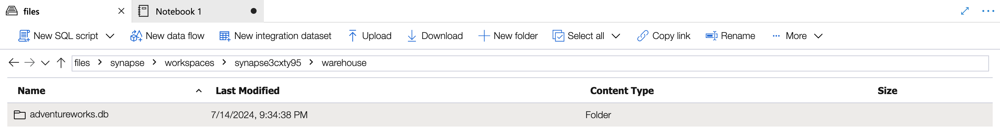
### Create a table using SQL
1. Add a new code cell, and then enter and run the following code:
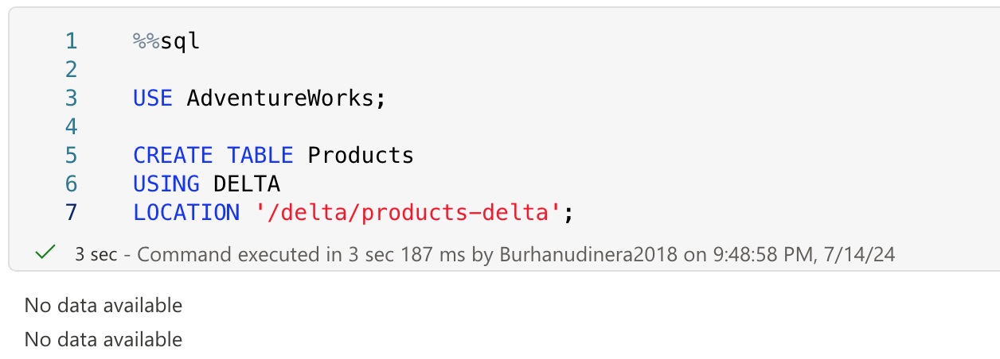
2. Add a new code cell, and then enter and run the following code:
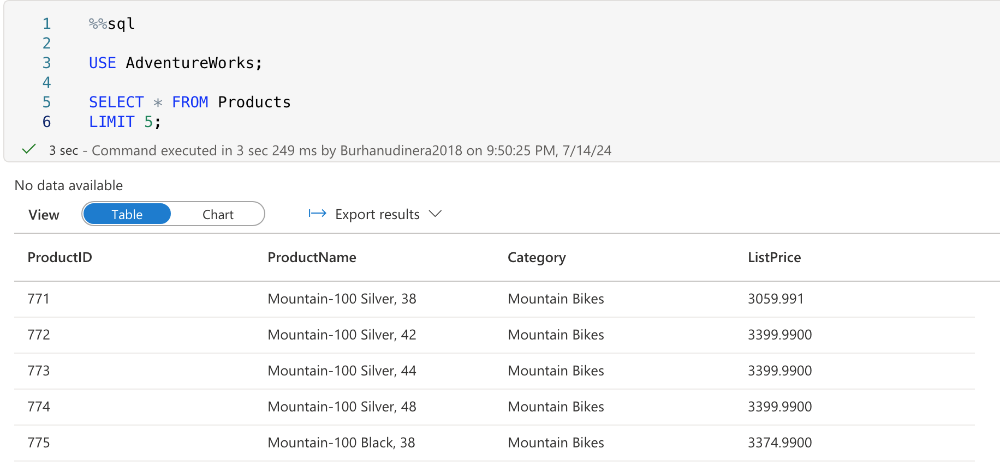
Observe that the new catalog table was created for the existing Delta Lake table folder, which reflects the changes that were made previously.

[...Learning Objective...](#0)
<a id='7.4'></a>
## Use delta tables for streaming data
Delta lake supports streaming data. Delta tables can be a sink or a source for data streams created using the Spark Structured Streaming API. In this example, you’ll use a delta table as a sink for some streaming data in a simulated internet of things (IoT) scenario.

1. Return to the **Notebook 1** tab and add a new code cell. Then, in the new cell, add the following code and run it:
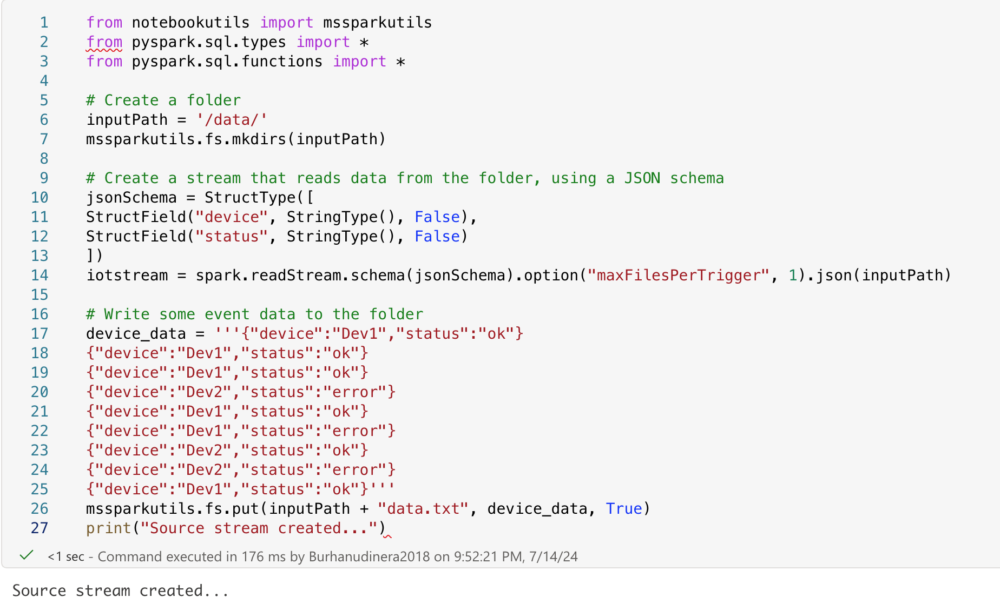
Ensure the message Source `stream created…` is printed. The code you just ran has created a streaming data source based on a folder to which some data has been saved, representing readings from hypothetical IoT devices.

2. In a new code cell, add and run the following code:
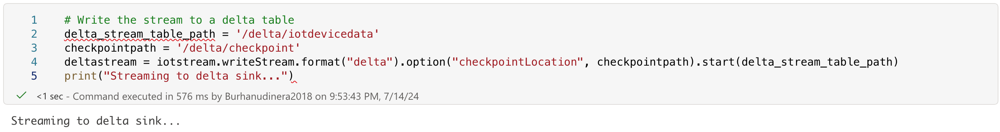
This code writes the streaming device data in delta format.

3. In a new code cell, add and run the following code:
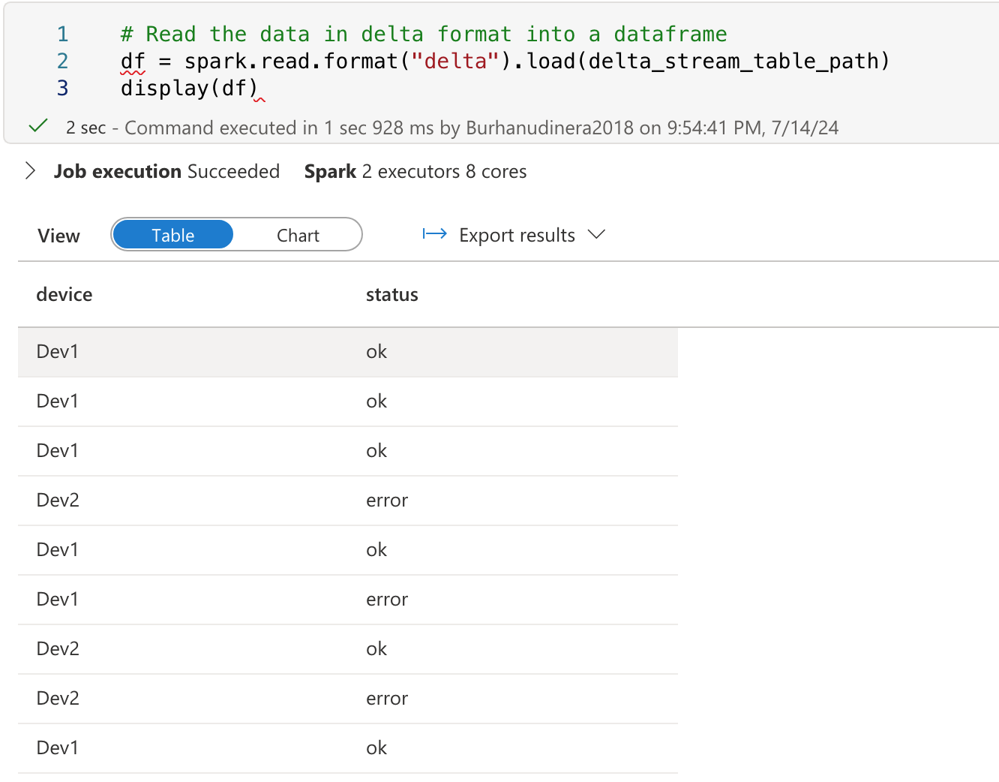
This code reads the streamed data in delta format into a dataframe. Note that the code to load streaming data is no different to that used to load static data from a delta folder.

4. In a new code cell, add and run the following code:
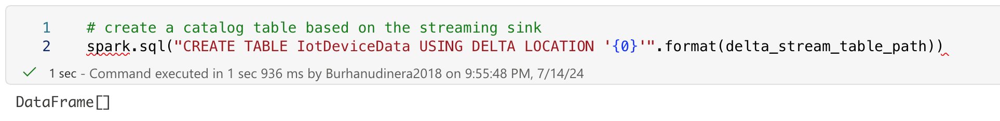
This code creates a catalog table named **IotDeviceData** (in the **default** database) based on the delta folder. Again, this code is the same as would be used for non-streaming data.

5. In a new code cell, add and run the following code:
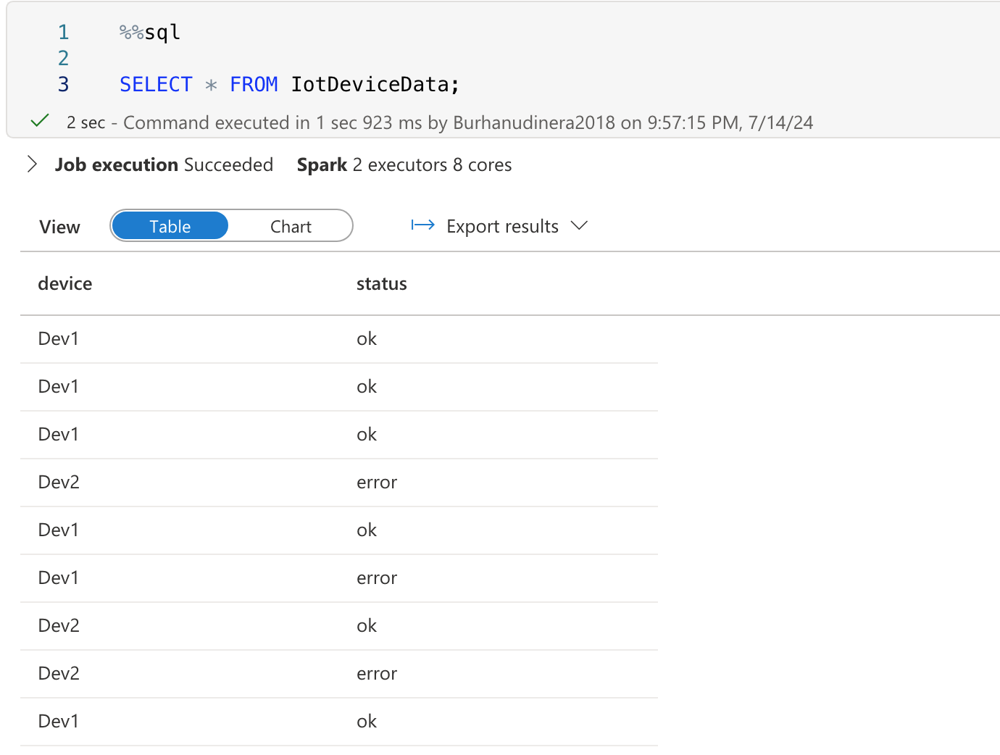
This code queries the **IotDeviceData** table, which contains the device data from the streaming source.

6. In a new code cell, add and run the following code:
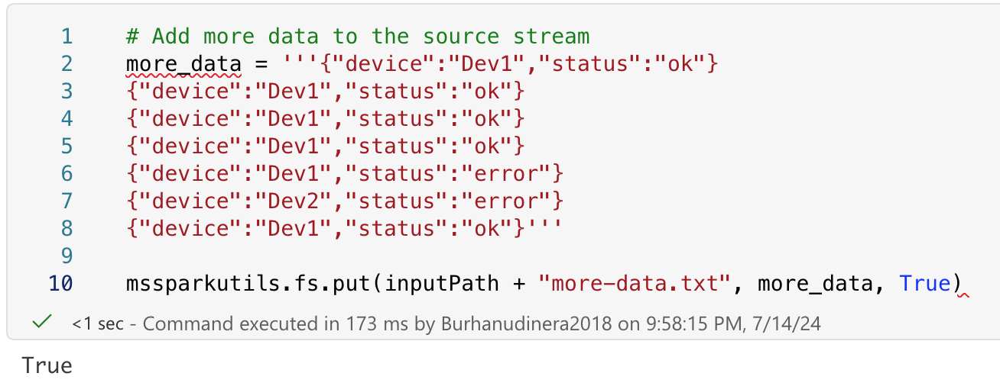
This code writes more hypothetical device data to the streaming source.

7. In a new code cell, add and run the following code:
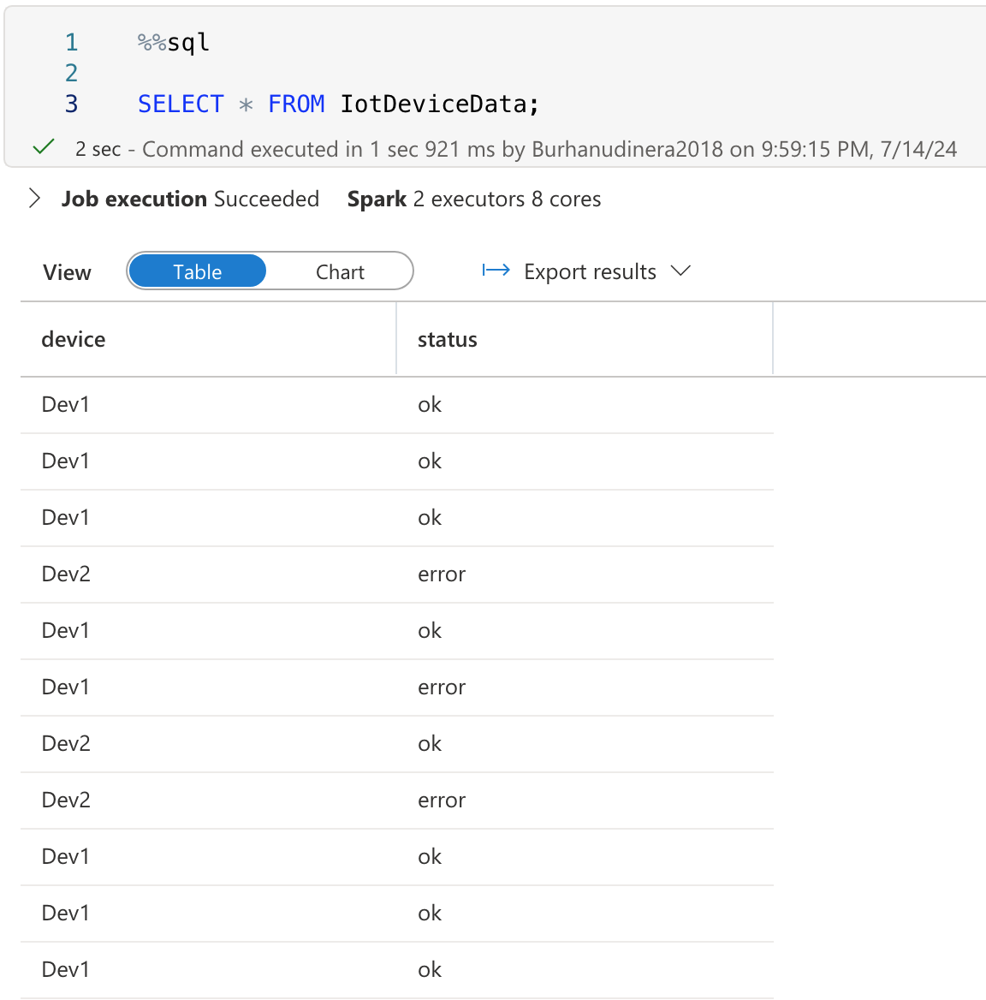
This code queries the **IotDeviceData** table again, which should now include the additional data that was added to the streaming source.

8. In a new code cell, add and run the following code:
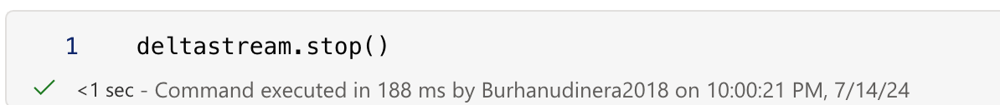
This code stops the stream.

[...Learning Objective...](#0)
<a id='7.5'></a>
## Query a delta table from a serverless SQL pool
In addition to Spark pools, Azure Synapse Analytics includes a built-in serverless SQL pool. You can use the relational database engine in this pool to query delta tables using SQL.

1. In the **files** tab, browse to the **files/delta** folder.
2. Select the **products-delta** folder, and on the toolbar, in the **New SQL script** drop-down list, select Select TOP 100 rows.
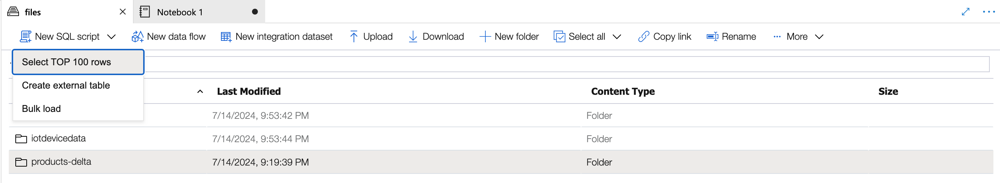
3. In the **Select TOP 100** rows pane, in the **File type** list, select **Delta format** and then select **Apply**.
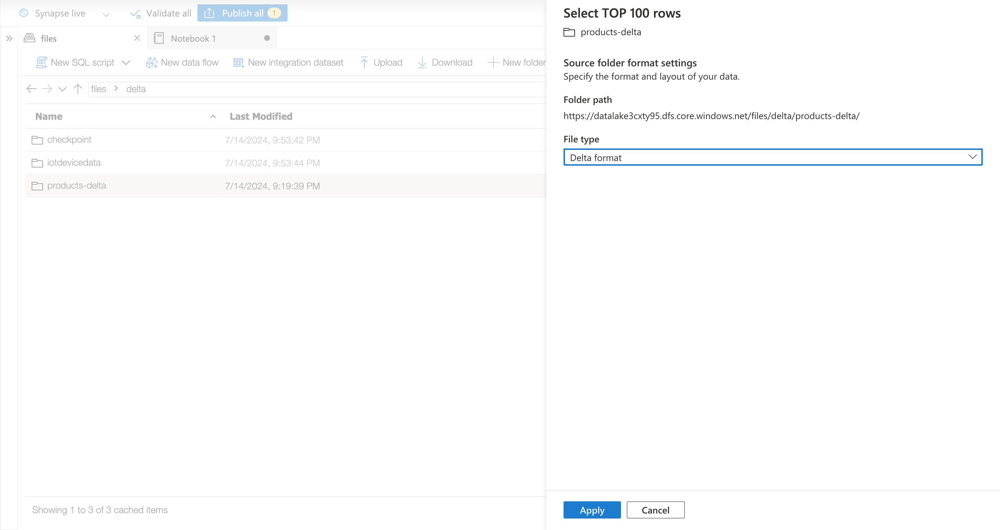
4. Review the SQL code that is generated, which should look like this:
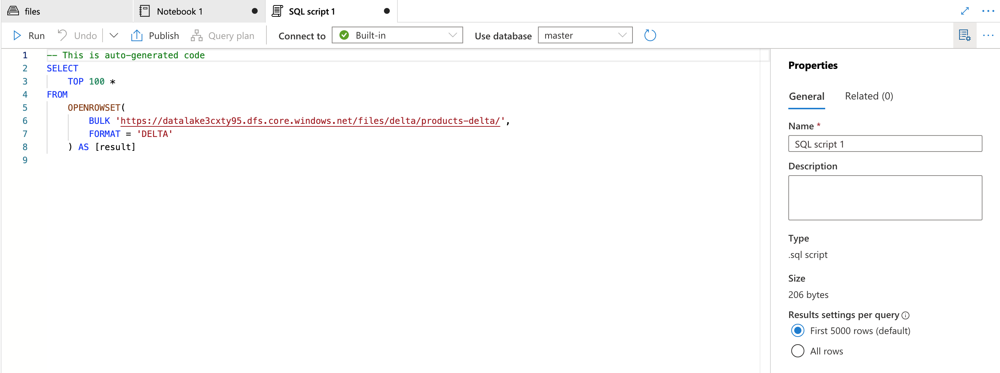
5. Use the ▷ **Run** icon to run the script, and review the results. They should look similar to this:
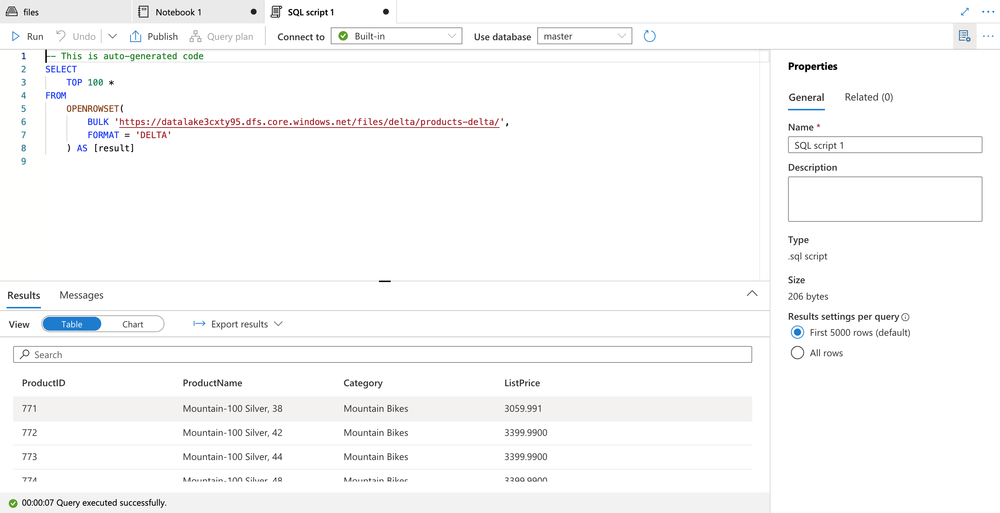
This demonstrates how you can use a serverless SQL pool to query delta format files that were created using Spark, and use the results for reporting or analysis.
6. Replace the query with the following SQL code:
7. Run the code and observe that you can also use the serverless SQL pool to query Delta Lake data in catalog tables that are defined the Spark metastore.
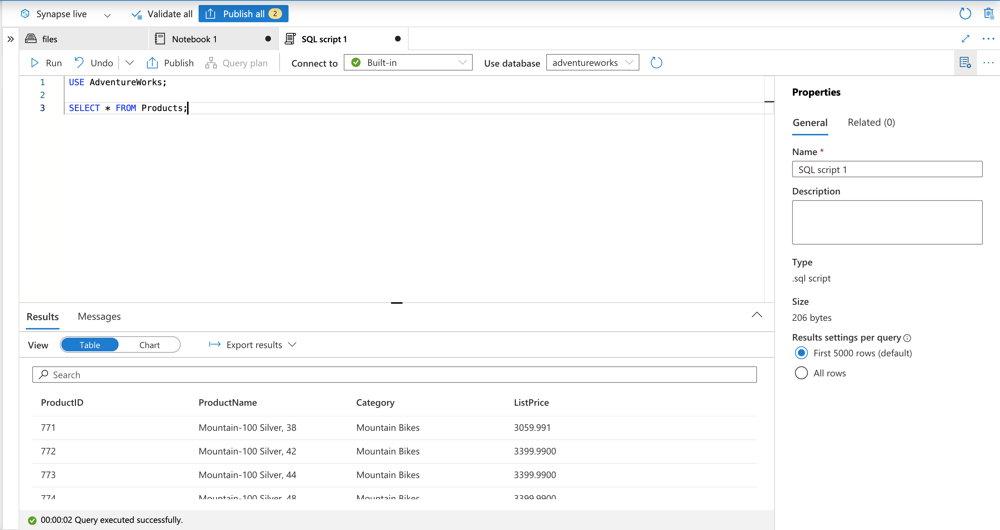
[...Learning Objective...](#0)
<a id='7.6'></a>
## Delete Azure resources
If you’ve finished exploring Azure Synapse Analytics, you should delete the resources you’ve created to avoid unnecessary Azure costs.

1. Close the Synapse Studio browser tab and return to the Azure portal.
2. On the Azure portal, on the Home page, select Resource groups.
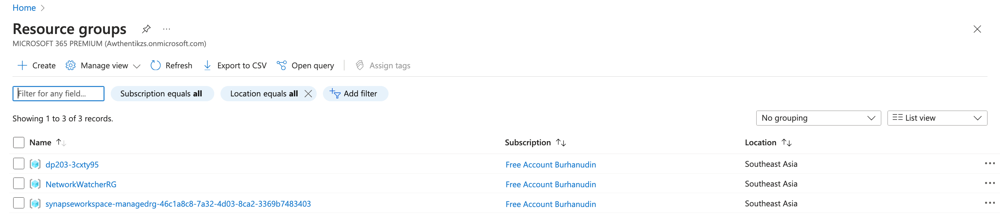
3. Select the dp203-xxxxxxx resource group for your Synapse Analytics workspace (not the managed resource group), and verify that it contains the Synapse workspace, storage account, and Spark pool for your workspace.
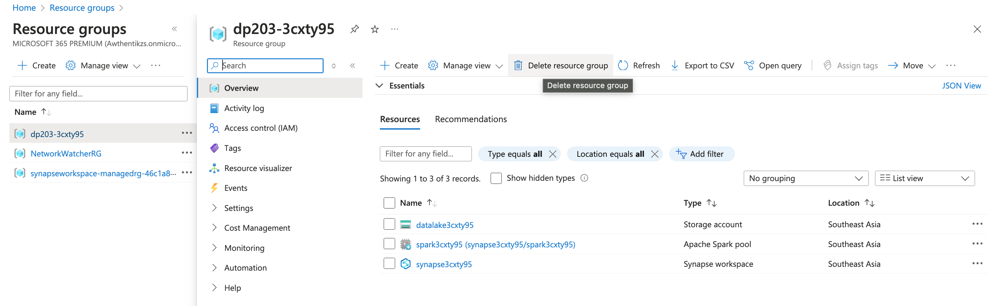
4. At the top of the Overview page for your resource group, select Delete resource group.
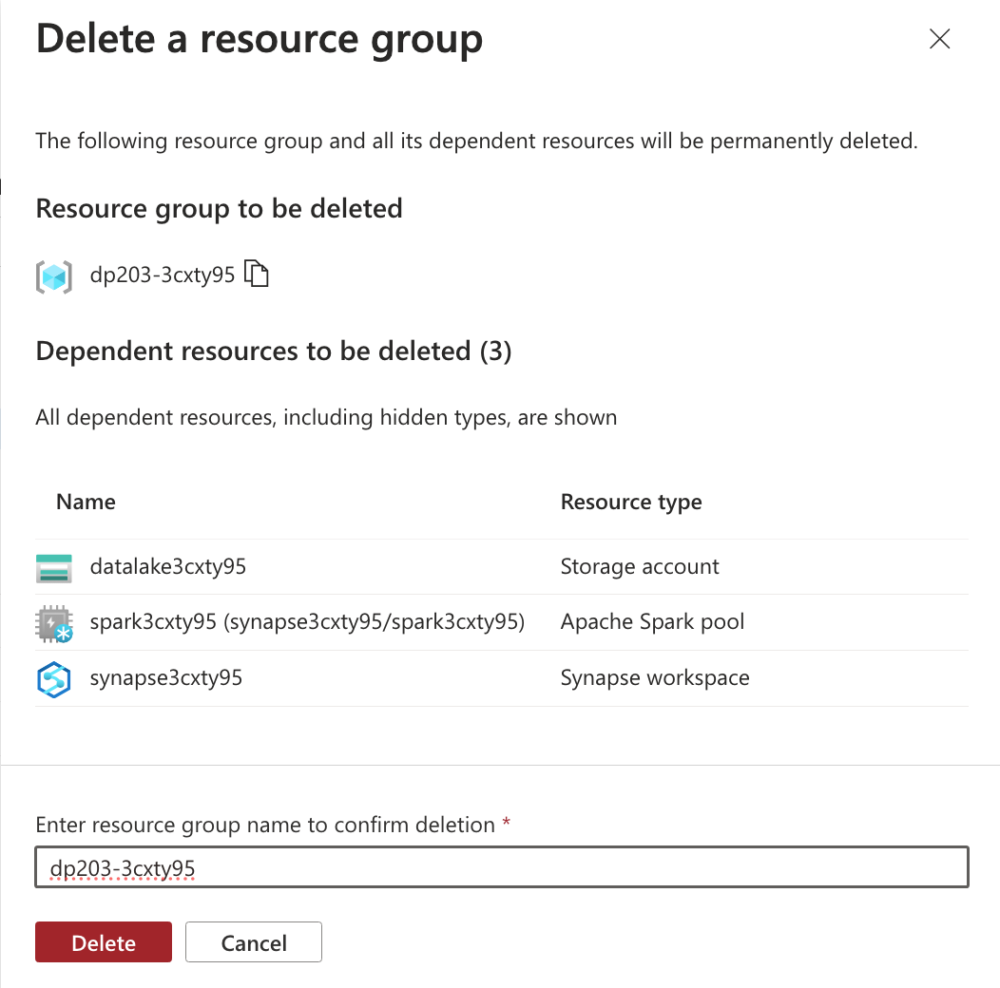
5. Enter the dp203-xxxxxxx resource group name to confirm you want to delete it, and select Delete.

After a few minutes, your Azure Synapse workspace resource group and the managed workspace resource group associated with it will be deleted.